Yanuar Alvin Rifkyarthara
IK-3C/3.34.23.2.25

Praktikum 1

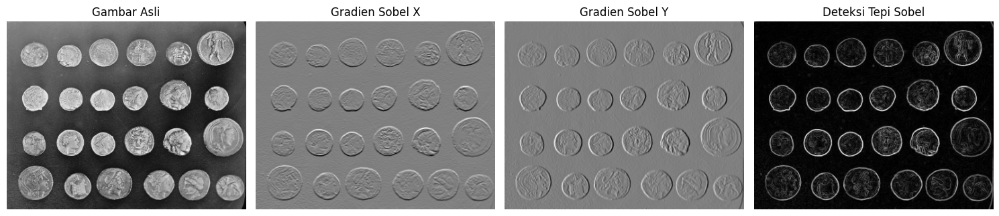

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

# Ambil gambar bawaan dari skimage
image = data.coins()

# Konversi ke grayscale jika gambar berwarna
if image.ndim == 3:
    gray_image = color.rgb2gray(image)
else:
    gray_image = image

# Hitung gradien menggunakan Operator Sobel
sobel_x = filters.sobel_h(gray_image)  # arah horizontal
sobel_y = filters.sobel_v(gray_image)  # arah vertikal
sobel_edge = filters.sobel(gray_image)  # kombinasi

# Visualisasi hasil
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
ax = axes.ravel()

# Gambar asli
ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

# Sobel X
ax[1].imshow(sobel_x, cmap='gray')
ax[1].set_title("Gradien Sobel X")
ax[1].axis("off")

# Sobel Y
ax[2].imshow(sobel_y, cmap='gray')
ax[2].set_title("Gradien Sobel Y")
ax[2].axis("off")

# Sobel gabungan
ax[3].imshow(sobel_edge, cmap='gray')
ax[3].set_title("Deteksi Tepi Sobel")
ax[3].axis("off")

plt.tight_layout()
plt.show()

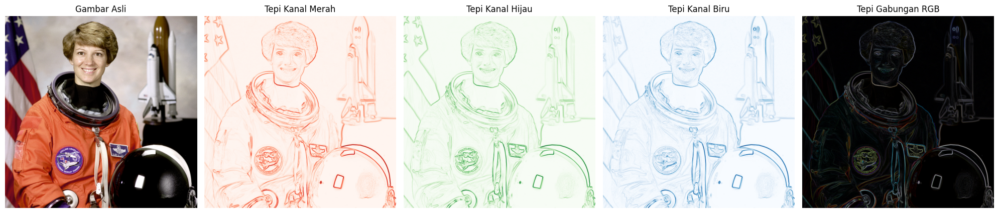

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters

# Ambil gambar bawaan dari skimage (gambar astronaut berwarna)
image = data.astronaut()

# Pisahkan kanal warna (RGB)
red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

# Terapkan Operator Sobel pada masing-masing kanal warna
sobel_red = filters.sobel(red_channel)
sobel_green = filters.sobel(green_channel)
sobel_blue = filters.sobel(blue_channel)

# Gabungkan hasil (stack jadi RGB kembali)
sobel_color = np.stack((sobel_red, sobel_green, sobel_blue), axis=2)

# Visualisasi hasil
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
ax = axes.ravel()

# Gambar asli
ax[0].imshow(image)
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

# Kanal merah
ax[1].imshow(sobel_red, cmap='Reds')
ax[1].set_title("Tepi Kanal Merah")
ax[1].axis("off")

# Kanal hijau
ax[2].imshow(sobel_green, cmap='Greens')
ax[2].set_title("Tepi Kanal Hijau")
ax[2].axis("off")

# Kanal biru
ax[3].imshow(sobel_blue, cmap='Blues')
ax[3].set_title("Tepi Kanal Biru")
ax[3].axis("off")

# Gabungan RGB
ax[4].imshow(sobel_color)
ax[4].set_title("Tepi Gabungan RGB")
ax[4].axis("off")

plt.tight_layout()
plt.show()

Praktikum 2

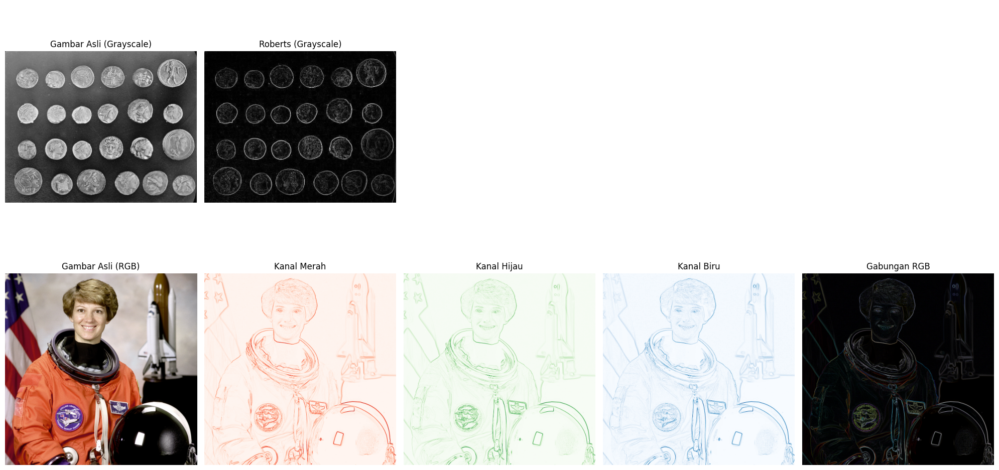

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters

# ===================== 1. DETEKSI TEPI ROBERTS (GRAYSCALE) =====================

# Ambil gambar grayscale
image_gray = data.coins()

# Terapkan operator Roberts
roberts_gray = filters.roberts(image_gray)

# ===================== 2. DETEKSI TEPI ROBERTS (BERWARNA) =====================

# Ambil gambar berwarna
image_color = data.astronaut()

# Pisahkan kanal RGB
red_channel = image_color[:, :, 0]
green_channel = image_color[:, :, 1]
blue_channel = image_color[:, :, 2]

# Terapkan Roberts pada masing-masing kanal
roberts_red = filters.roberts(red_channel)
roberts_green = filters.roberts(green_channel)
roberts_blue = filters.roberts(blue_channel)

# Gabungkan kembali
roberts_color = np.stack((roberts_red, roberts_green, roberts_blue), axis=2)

# ===================== VISUALISASI =====================

fig, axes = plt.subplots(2, 5, figsize=(20, 10))
ax = axes.ravel()

# Baris 1: Grayscale
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(roberts_gray, cmap='gray')
ax[1].set_title("Roberts (Grayscale)")
ax[1].axis("off")

# Kosongkan slot
for i in range(2, 5):
    ax[i].axis("off")

# Baris 2: Berwarna
ax[5].imshow(image_color)
ax[5].set_title("Gambar Asli (RGB)")
ax[5].axis("off")

ax[6].imshow(roberts_red, cmap='Reds')
ax[6].set_title("Kanal Merah")
ax[6].axis("off")

ax[7].imshow(roberts_green, cmap='Greens')
ax[7].set_title("Kanal Hijau")
ax[7].axis("off")

ax[8].imshow(roberts_blue, cmap='Blues')
ax[8].set_title("Kanal Biru")
ax[8].axis("off")

ax[9].imshow(roberts_color)
ax[9].set_title("Gabungan RGB")
ax[9].axis("off")

plt.tight_layout()
plt.show()

Praktikum 3

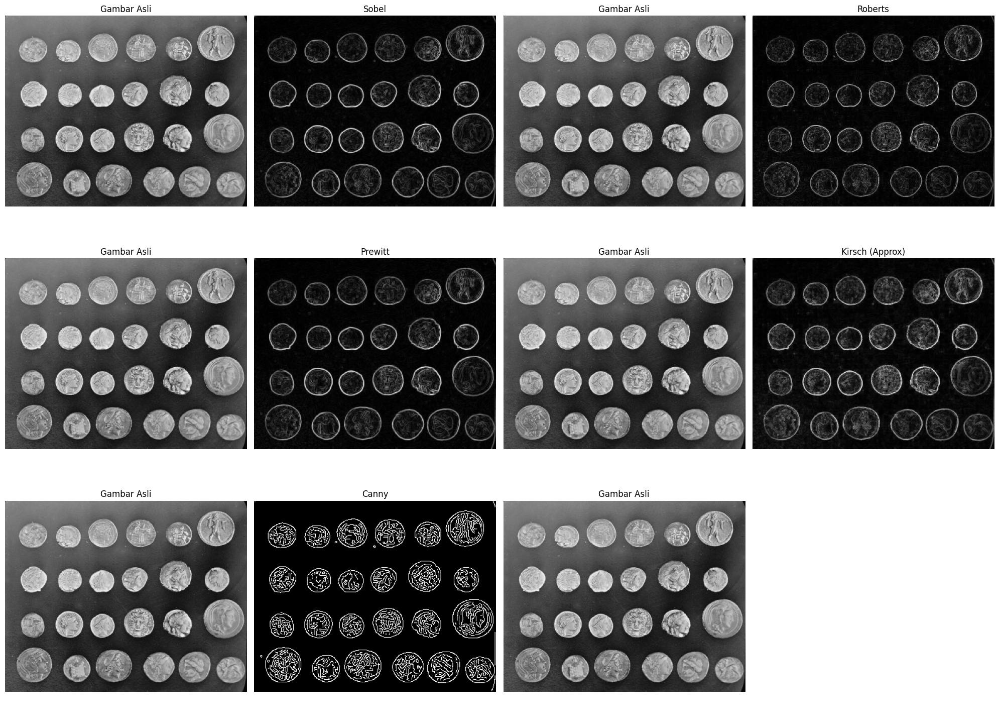

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1. AMBIL GAMBAR =====================
image_gray = data.coins()

# ===================== 2. DETEKSI TEPI =====================

# Sobel
sobel_edge = filters.sobel(image_gray)

# Roberts
roberts_edge = filters.roberts(image_gray)

# Prewitt
prewitt_edge = filters.prewitt(image_gray)

# Kirsch (aproksimasi via morphological gradient)
kirsch_edge = gradient(image_gray, disk(1))

# Canny
canny_edge = feature.canny(image_gray, sigma=1)

# ===================== 3. VISUALISASI =====================

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

# Baris 1
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

ax[1].imshow(sobel_edge, cmap='gray')
ax[1].set_title("Sobel")
ax[1].axis("off")

ax[2].imshow(image_gray, cmap='gray')
ax[2].set_title("Gambar Asli")
ax[2].axis("off")

ax[3].imshow(roberts_edge, cmap='gray')
ax[3].set_title("Roberts")
ax[3].axis("off")

# Baris 2
ax[4].imshow(image_gray, cmap='gray')
ax[4].set_title("Gambar Asli")
ax[4].axis("off")

ax[5].imshow(prewitt_edge, cmap='gray')
ax[5].set_title("Prewitt")
ax[5].axis("off")

ax[6].imshow(image_gray, cmap='gray')
ax[6].set_title("Gambar Asli")
ax[6].axis("off")

ax[7].imshow(kirsch_edge, cmap='gray')
ax[7].set_title("Kirsch (Approx)")
ax[7].axis("off")

# Baris 3
ax[8].imshow(image_gray, cmap='gray')
ax[8].set_title("Gambar Asli")
ax[8].axis("off")

ax[9].imshow(canny_edge, cmap='gray')
ax[9].set_title("Canny")
ax[9].axis("off")

ax[10].imshow(image_gray, cmap='gray')
ax[10].set_title("Gambar Asli")
ax[10].axis("off")

# Kosongkan slot terakhir
ax[11].axis("off")

plt.tight_layout()
plt.show()

Praktikum 4

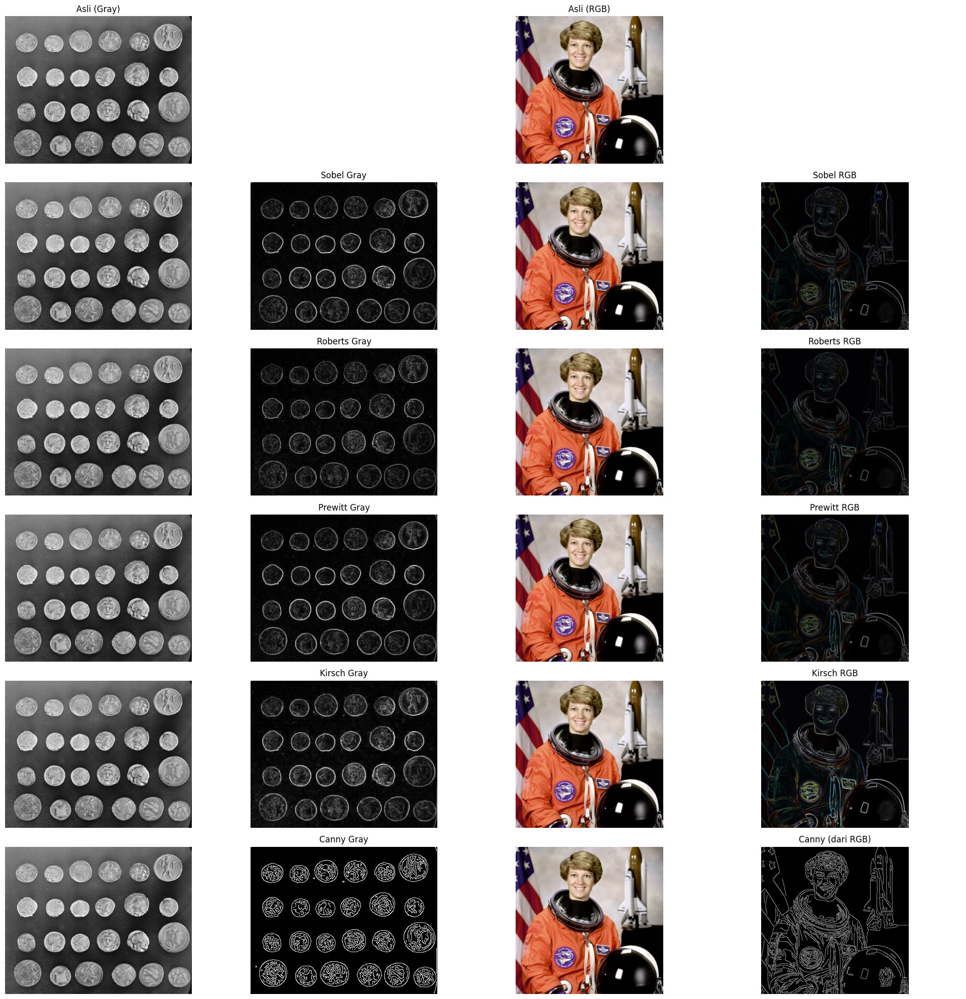

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature, color
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1. AMBIL GAMBAR =====================
image_gray = data.coins()
image_color = data.astronaut()

# ===================== 2. DETEKSI TEPI =====================

# --- Grayscale ---
sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

# --- Fungsi untuk RGB ---
def apply_edge_detection(image, operator):
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])
    return np.stack((red, green, blue), axis=2)

# --- Berwarna ---
sobel_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img: gradient(img, disk(1)))

# Canny hanya untuk grayscale
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)

# ===================== 3. VISUALISASI =====================
fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

# Baris 1: Asli
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Asli (Gray)")
ax[0].axis("off")

ax[1].axis("off")

ax[2].imshow(image_color)
ax[2].set_title("Asli (RGB)")
ax[2].axis("off")

ax[3].axis("off")

# Baris 2: Sobel
ax[4].imshow(image_gray, cmap='gray'); ax[4].axis("off")
ax[5].imshow(sobel_gray, cmap='gray'); ax[5].set_title("Sobel Gray"); ax[5].axis("off")
ax[6].imshow(image_color); ax[6].axis("off")
ax[7].imshow(sobel_color); ax[7].set_title("Sobel RGB"); ax[7].axis("off")

# Baris 3: Roberts
ax[8].imshow(image_gray, cmap='gray'); ax[8].axis("off")
ax[9].imshow(roberts_gray, cmap='gray'); ax[9].set_title("Roberts Gray"); ax[9].axis("off")
ax[10].imshow(image_color); ax[10].axis("off")
ax[11].imshow(roberts_color); ax[11].set_title("Roberts RGB"); ax[11].axis("off")

# Baris 4: Prewitt
ax[12].imshow(image_gray, cmap='gray'); ax[12].axis("off")
ax[13].imshow(prewitt_gray, cmap='gray'); ax[13].set_title("Prewitt Gray"); ax[13].axis("off")
ax[14].imshow(image_color); ax[14].axis("off")
ax[15].imshow(prewitt_color); ax[15].set_title("Prewitt RGB"); ax[15].axis("off")

# Baris 5: Kirsch
ax[16].imshow(image_gray, cmap='gray'); ax[16].axis("off")
ax[17].imshow(kirsch_gray, cmap='gray'); ax[17].set_title("Kirsch Gray"); ax[17].axis("off")
ax[18].imshow(image_color); ax[18].axis("off")
ax[19].imshow(kirsch_color); ax[19].set_title("Kirsch RGB"); ax[19].axis("off")

# Baris 6: Canny
ax[20].imshow(image_gray, cmap='gray'); ax[20].axis("off")
ax[21].imshow(canny_gray, cmap='gray'); ax[21].set_title("Canny Gray"); ax[21].axis("off")
ax[22].imshow(image_color); ax[22].axis("off")
ax[23].imshow(canny_color, cmap='gray'); ax[23].set_title("Canny (dari RGB)"); ax[23].axis("off")

plt.tight_layout()
plt.show()

In [2]:
from google.colab import files
uploaded = files.upload()


Saving makan.jpeg to makan.jpeg


In [3]:
image = io.imread('makan.jpeg')

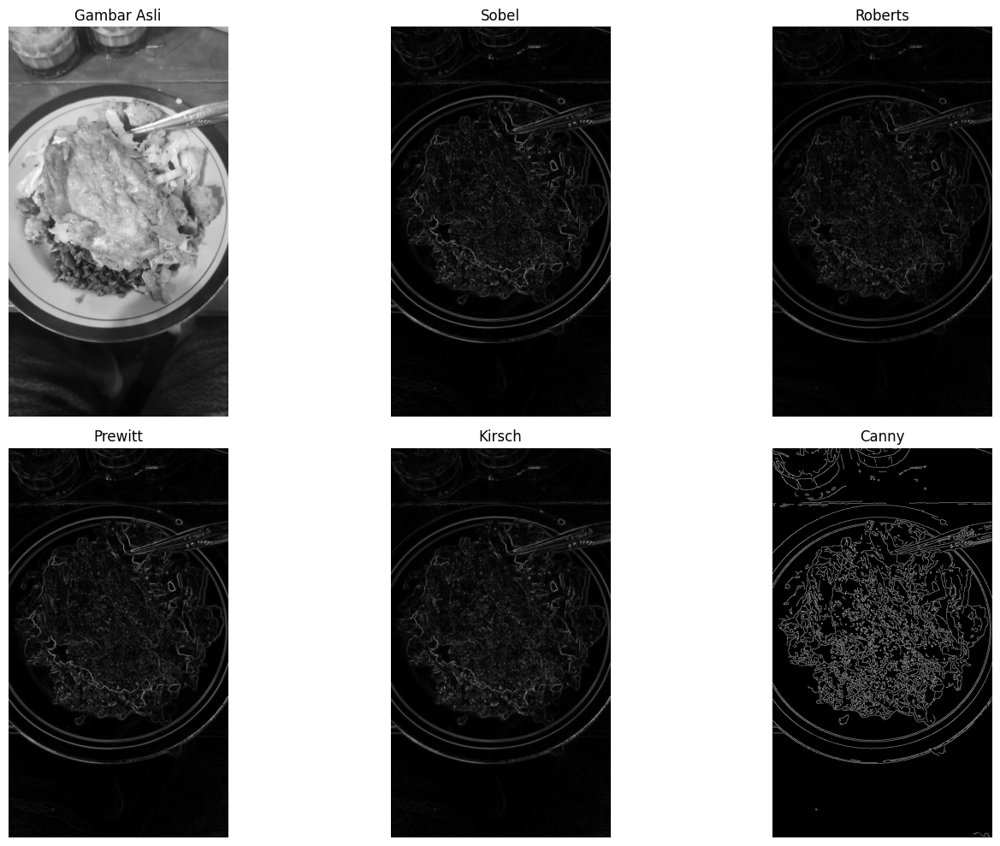

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1. LOAD GAMBAR =====================
image = io.imread('makan.jpeg')  # sesuai nama file kamu

# Konversi ke grayscale
gray = color.rgb2gray(image)

# ===================== 2. DETEKSI TEPI =====================

# Sobel
sobel = filters.sobel(gray)

# Roberts
roberts = filters.roberts(gray)

# Prewitt
prewitt = filters.prewitt(gray)

# Kirsch (approx)
kirsch = gradient((gray * 255).astype(np.uint8), disk(1))

# Canny
canny = feature.canny(gray, sigma=1)

# ===================== 3. VISUALISASI =====================
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
ax = axes.ravel()

ax[0].imshow(gray, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

ax[1].imshow(sobel, cmap='gray')
ax[1].set_title("Sobel")
ax[1].axis("off")

ax[2].imshow(roberts, cmap='gray')
ax[2].set_title("Roberts")
ax[2].axis("off")

ax[3].imshow(prewitt, cmap='gray')
ax[3].set_title("Prewitt")
ax[3].axis("off")

ax[4].imshow(kirsch, cmap='gray')
ax[4].set_title("Kirsch")
ax[4].axis("off")

ax[5].imshow(canny, cmap='gray')
ax[5].set_title("Canny")
ax[5].axis("off")

plt.tight_layout()
plt.show()